---
title: "Segmenting Carvana using Resnet-18"
author: "Devansh Lodha"
date: "2024-12-31"
description: "Car Pixel Party: Segmenting with ResNet18!"
categories: [code, image segmentation]
image: "carvana-seg-example.png"
jupyter: python3
format: html
---

## Setup and Imports

In [65]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn.functional as F
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Dataset Exploration

In [66]:
class CarvanaDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx].replace('.jpg', '_mask.gif'))
        image = np.array(Image.open(img_path).convert('RGB'))
        mask = np.array(Image.open(mask_path).convert('L'), dtype=np.float32)
        mask[mask == 255.0] = 1.0
        
        if self.transform:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentations['image']
            mask = augmentations['mask']
        
        return image, mask

In [67]:
def visualize_dataset_samples(dataset, num_samples=3):
    plt.figure(figsize=(15, 5*num_samples))
    for i in range(num_samples):
        image, mask = dataset[i]
        
        # Convert tensors back to numpy arrays for plotting
        if torch.is_tensor(image):
            image = image.numpy().transpose(1, 2, 0)
            # Denormalize if needed
            image = (image * [1.0, 1.0, 1.0]) + [0.0, 0.0, 0.0]
            image = np.clip(image, 0, 1)
        
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(image)
        plt.title(f'Image {i}')
        plt.axis('off')
        
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f'Mask {i}')
        plt.axis('off')
        
        plt.subplot(num_samples, 3, i*3 + 3)
        # Overlay mask on image
        overlay = image.copy()
        overlay[mask == 1] = [1, 0, 0]  # Red overlay for segmentation
        plt.imshow(overlay)
        plt.title(f'Overlay {i}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

In [68]:
dataset = CarvanaDataset('data/train', 'data/train_masks', transform=None)

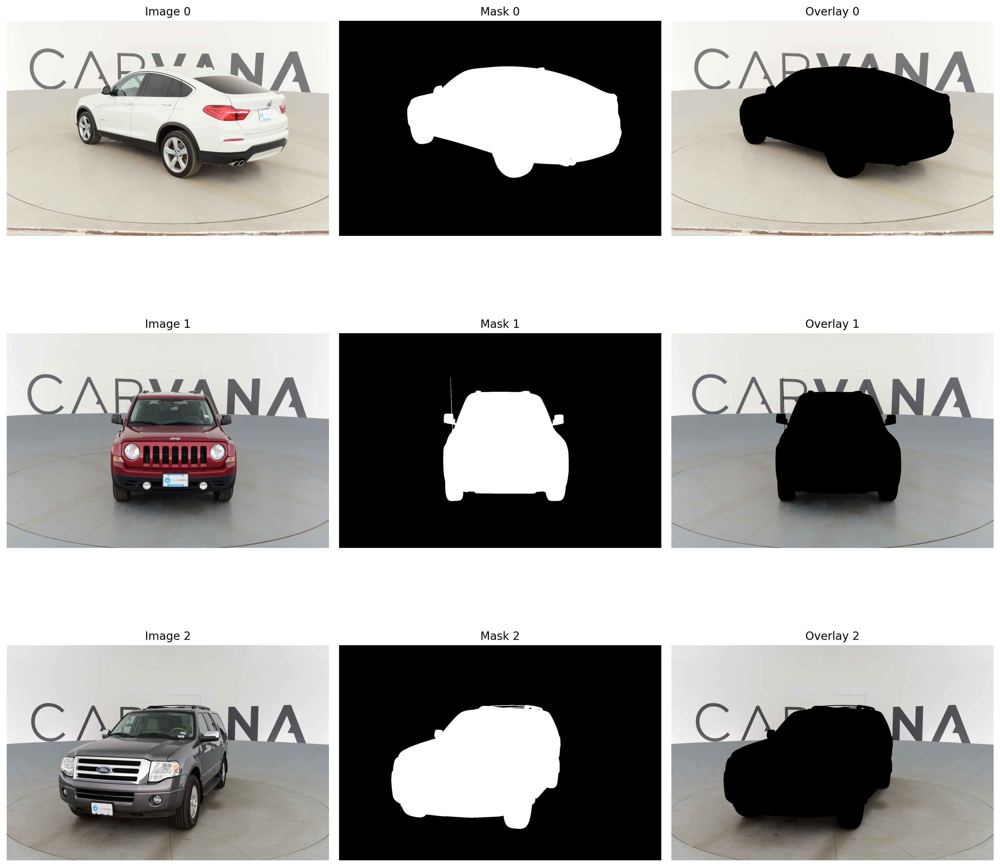

In [69]:
visualize_dataset_samples(dataset)

## 3. Model Architecture

In [ ]:
class ResNetSegmentation(nn.Module):
    def __init__(self, num_classes=1):
        super(ResNetSegmentation, self).__init__()
        # Load pretrained ResNet18
        resnet = models.resnet18(pretrained=True)
        
        # Encoder (use ResNet layers)
        self.encoder1 = nn.Sequential(
            resnet.conv1,
            resnet.bn1,
            resnet.relu
        )  # 64 channels
        self.pool = resnet.maxpool
        self.encoder2 = resnet.layer1  # 64 channels
        self.encoder3 = resnet.layer2  # 128 channels
        self.encoder4 = resnet.layer3  # 256 channels
        self.encoder5 = resnet.layer4  # 512 channels
        
        # Decoder (like upstream of UNET)
        self.decoder1 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.decoder2 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.decoder3 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.decoder4 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True)
        )
        self.decoder5 = nn.Sequential(
            nn.ConvTranspose2d(32, num_classes, kernel_size=2, stride=2),
        )
        
    def forward(self, x):
        # Store input size for later resizing
        input_size = x.shape[-2:]
        
        # Encode
        x1 = self.encoder1(x)
        x1p = self.pool(x1)
        x2 = self.encoder2(x1p)
        x3 = self.encoder3(x2)
        x4 = self.encoder4(x3)
        x5 = self.encoder5(x4)
        
        # Decode
        d1 = self.decoder1(x5)
        d2 = self.decoder2(d1)
        d3 = self.decoder3(d2)
        d4 = self.decoder4(d3)
        d5 = self.decoder5(d4)
        
        # Resize output to match target size
        if d5.shape[-2:] != input_size:
            d5 = F.interpolate(d5, size=input_size, mode='bilinear', align_corners=False)
        
        return d5

## 4. Training Setup

In [74]:
# Hyperparameters
LEARNING_RATE = 1e-4
DEVICE = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
BATCH_SIZE = 8
NUM_EPOCHS = 5

# Directories
TRAIN_IMG_DIR = "data/train/"
TRAIN_MASK_DIR = "data/train_masks/"
VAL_IMG_DIR = "data/val/"
VAL_MASK_DIR = "data/val_masks/"

# Transforms
train_transform = A.Compose([
    A.Resize(1280, 1918),  # Force specific dimensions
    A.Rotate(limit=35, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.1),
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
        max_pixel_value=255.0
    ),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(1280, 1918),  # Force specific dimensions
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
        max_pixel_value=255.0
    ),
    ToTensorV2()
])

def train_one_epoch(loader, model, optimizer, loss_fn, device):
    model.train()
    loop = tqdm(loader)
    running_loss = 0.0
    
    for batch_idx, (data, targets) in enumerate(loop):
        data = data.to(device)
        targets = targets.float().unsqueeze(1).to(device)
        
        # forward
        predictions = model(data)
        loss = loss_fn(predictions, targets)
        
        # backward
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        loop.set_postfix(loss=loss.item())
    
    return running_loss / len(loader)

def evaluate(loader, model, device):
    model.eval()
    dice_score = 0
    num_correct = 0
    num_pixels = 0
    
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device).unsqueeze(1)
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            
            num_correct += (preds == y).sum()
            num_pixels += torch.numel(preds)
            dice_score += (2 * (preds * y).sum()) / ((preds + y).sum() + 1e-8)
    
    accuracy = (num_correct / num_pixels * 100).item()
    dice = (dice_score / len(loader)).item()
    
    return accuracy, dice

def plot_predictions(model, val_loader, device, num_samples=3):
    model.eval()
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))
    
    with torch.no_grad():
        for idx, (x, y) in enumerate(val_loader):
            if idx >= num_samples:
                break
                
            x = x.to(device)
            preds = torch.sigmoid(model(x))
            preds = (preds > 0.5).float()
            
            # Convert to numpy and denormalize
            img = x[0].cpu().numpy().transpose(1, 2, 0)
            img = img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
            img = np.clip(img * 255, 0, 255).astype(np.uint8)
            
            mask = y[0].cpu().numpy() * 255
            pred = preds[0].cpu().numpy()[0] * 255
            
            axes[idx, 0].imshow(img)
            axes[idx, 0].set_title('Original Image')
            axes[idx, 0].axis('off')
            
            axes[idx, 1].imshow(mask, cmap='gray')
            axes[idx, 1].set_title('Ground Truth')
            axes[idx, 1].axis('off')
            
            axes[idx, 2].imshow(pred, cmap='gray')
            axes[idx, 2].set_title('Prediction')
            axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_training_history(train_losses, val_accuracies, val_dices):
    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_losses, 'b-')
    plt.title('Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    
    plt.subplot(1, 3, 2)
    plt.plot(epochs, val_accuracies, 'g-')
    plt.title('Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    
    plt.subplot(1, 3, 3)
    plt.plot(epochs, val_dices, 'r-')
    plt.title('Validation Dice Score')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Score')
    
    plt.tight_layout()
    plt.show()

def main():
    # Create data loaders
    train_ds = CarvanaDataset(TRAIN_IMG_DIR, TRAIN_MASK_DIR, train_transform)
    val_ds = CarvanaDataset(VAL_IMG_DIR, VAL_MASK_DIR, val_transform)
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
    
    # Initialize model, loss, optimizer
    model = ResNetSegmentation().to(DEVICE)
    loss_fn = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    
    # Training history
    train_losses = []
    val_accuracies = []
    val_dices = []
    
    # Training loop
    print("Starting training...")
    for epoch in range(NUM_EPOCHS):
        print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
        
        # Train
        train_loss = train_one_epoch(train_loader, model, optimizer, loss_fn, DEVICE)
        train_losses.append(train_loss)
        
        # Evaluate
        accuracy, dice = evaluate(val_loader, model, DEVICE)
        val_accuracies.append(accuracy)
        val_dices.append(dice)
        
        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Accuracy: {accuracy:.2f}%")
        print(f"Val Dice Score: {dice:.4f}")
        
        # Plot some predictions at the end of each epoch
        plot_predictions(model, val_loader, DEVICE)
    
    # Plot training history
    plot_training_history(train_losses, val_accuracies, val_dices)
    
    # Save final model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_losses': train_losses,
        'val_accuracies': val_accuracies,
        'val_dices': val_dices
    }, 'resnet18_segmentation_final.pth')

Starting training...
Epoch 1/5


100%|██████████| 630/630 [26:27<00:00,  2.52s/it, loss=0.147]


Train Loss: 0.2297
Val Accuracy: 99.72%
Val Dice Score: 0.9930


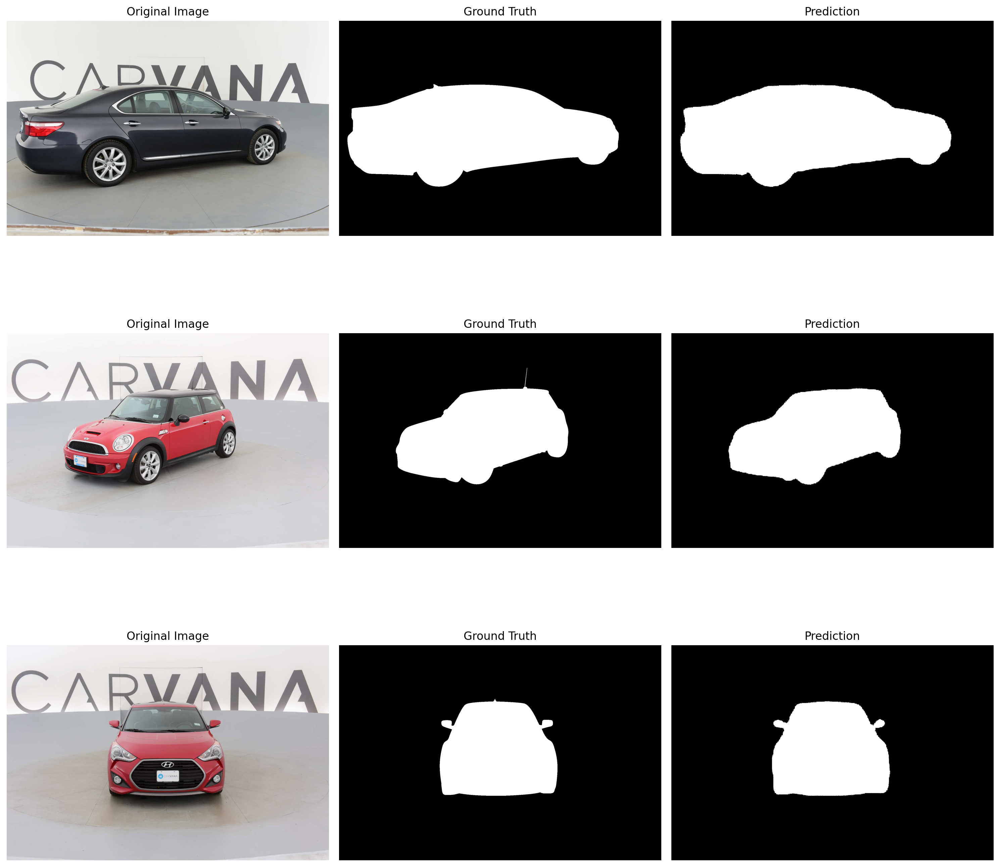

Epoch 2/5


100%|██████████| 630/630 [23:35<00:00,  2.25s/it, loss=0.0688]


Train Loss: 0.0985
Val Accuracy: 99.79%
Val Dice Score: 0.9948


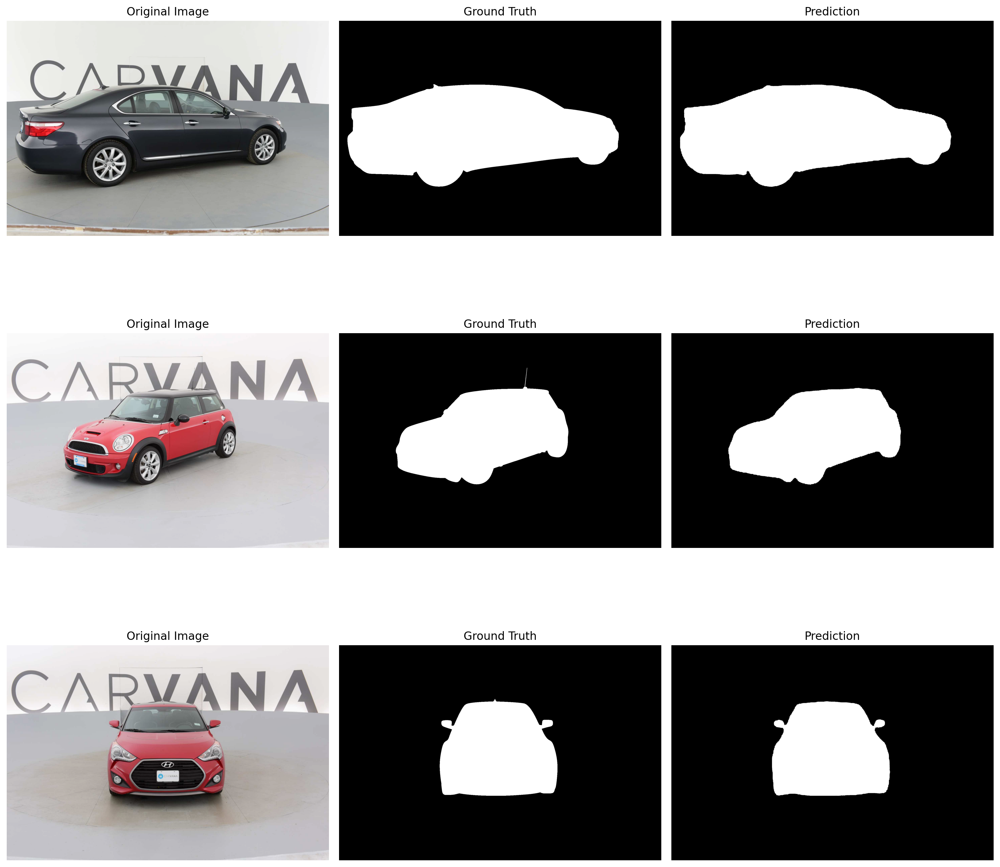

Epoch 3/5


100%|██████████| 630/630 [25:59<00:00,  2.48s/it, loss=0.0394]


Train Loss: 0.0540
Val Accuracy: 99.81%
Val Dice Score: 0.9953


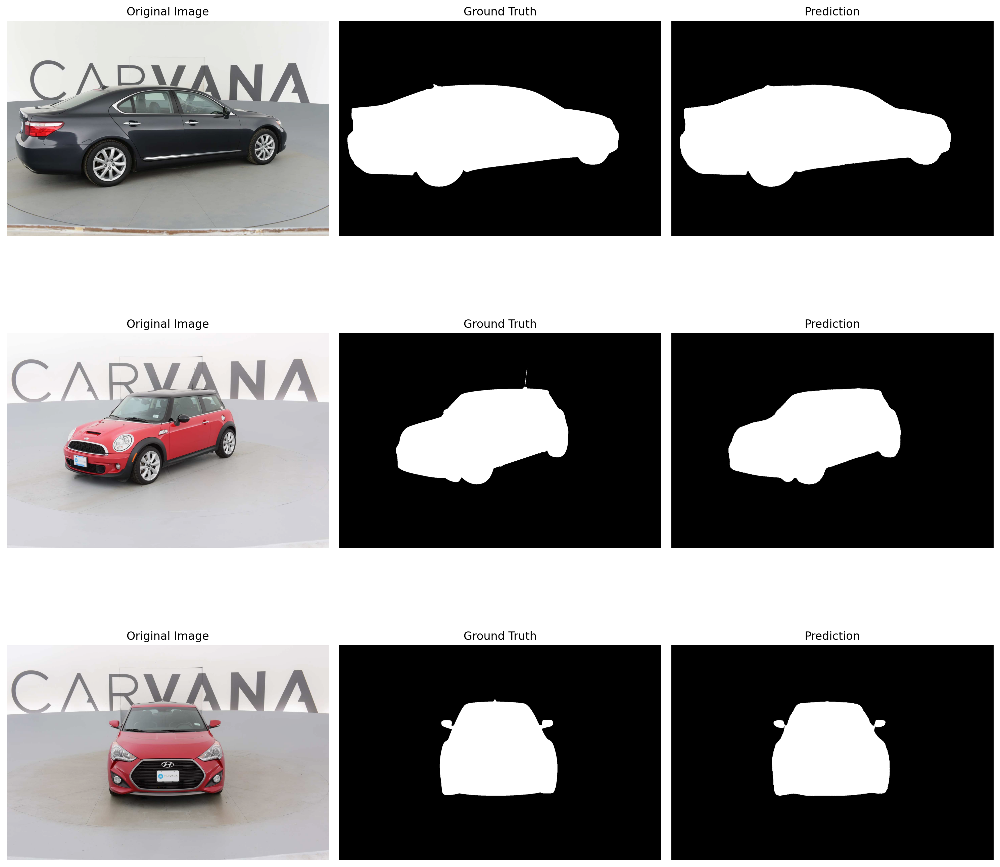

Epoch 4/5


100%|██████████| 630/630 [26:39<00:00,  2.54s/it, loss=0.0255]


Train Loss: 0.0321
Val Accuracy: 99.83%
Val Dice Score: 0.9957


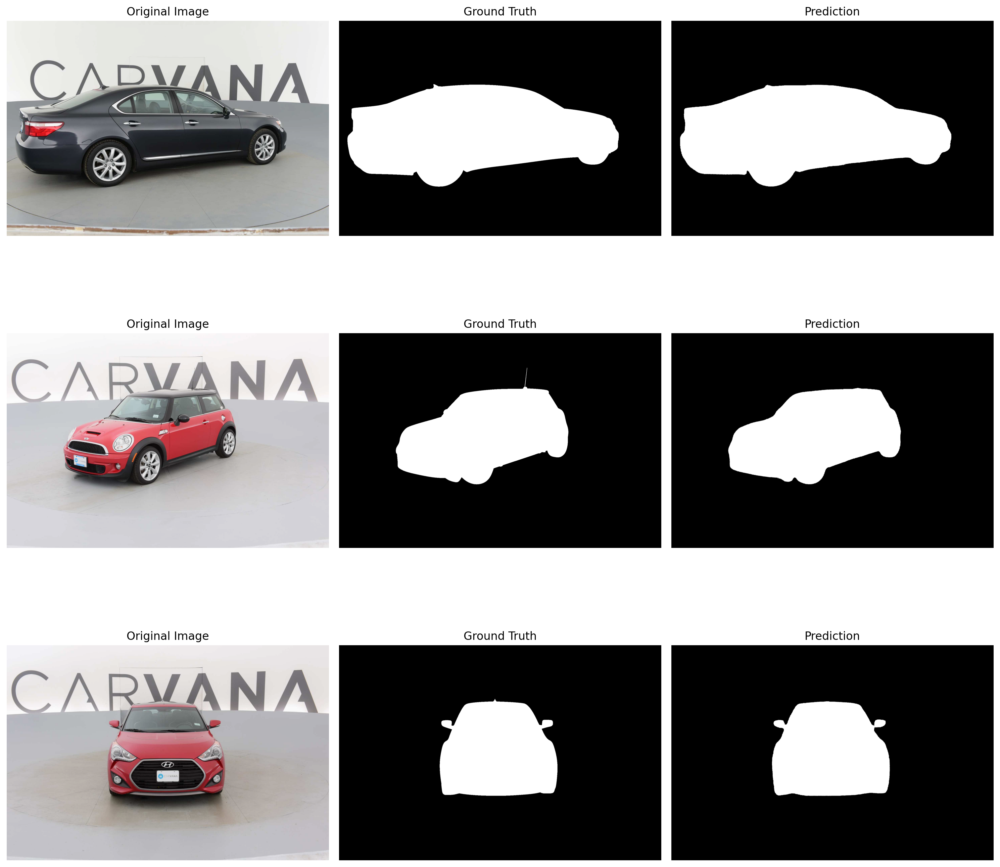

Epoch 5/5


100%|██████████| 630/630 [24:39<00:00,  2.35s/it, loss=0.0179]


Train Loss: 0.0209
Val Accuracy: 99.83%
Val Dice Score: 0.9959


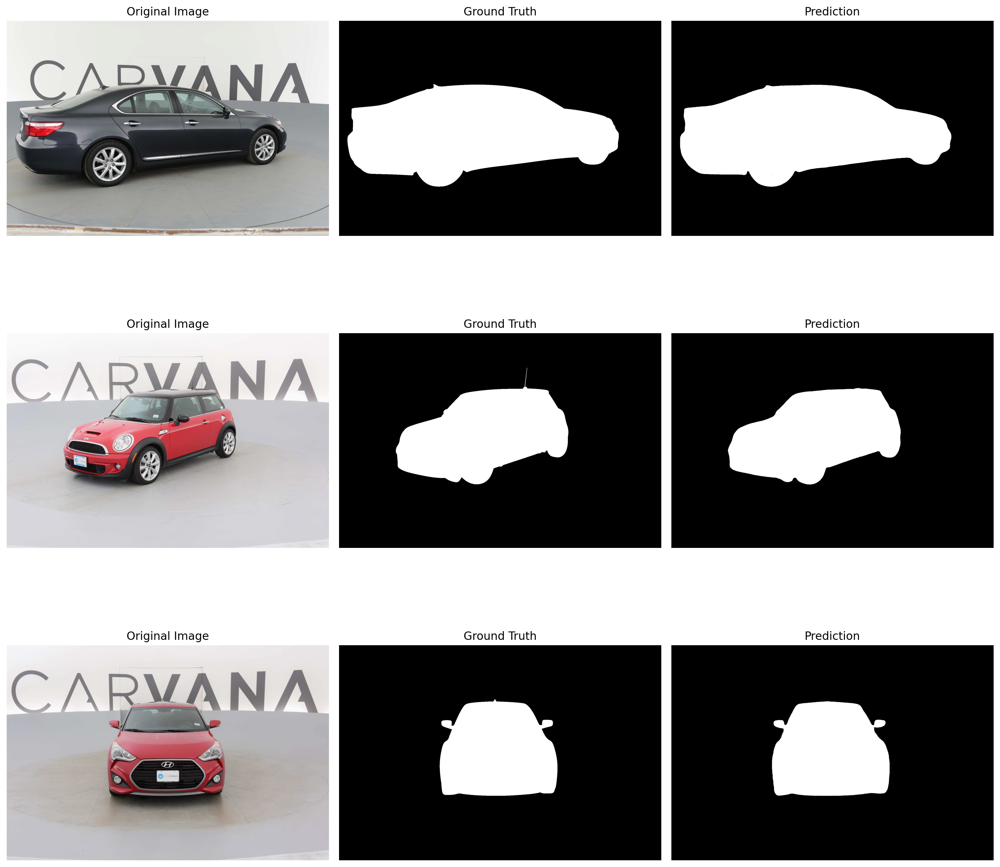

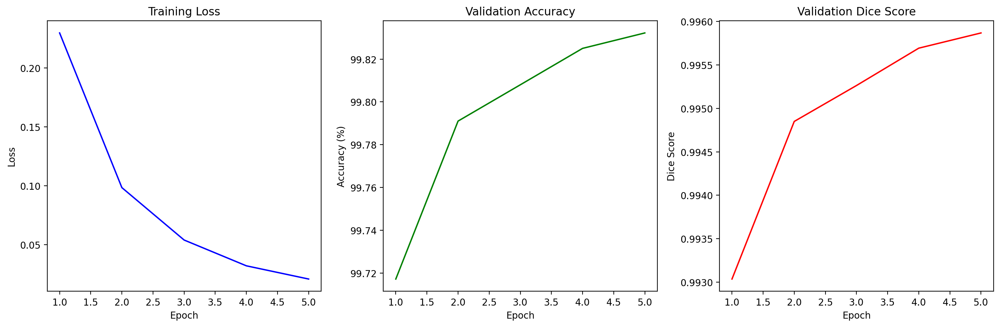

In [75]:
main()